# THE EFFECTS OF COVID 19 ON CRIME RATE: A CASE STUDY OF ESSEX.






# INTRODUCTION

In late December 2019, a previously unidentified coronavirus, currently named as the 2019 novel coronavirus, emerged from Wuhan, China, and resulted in a formidable outbreak in many cities in China and expanded globally.( Wu et al 2020). It is a viral disease that affects the respiratory system which ranges from common flu to severe respiratory infection. The coronavirus is spread through droplets and virus particles released into the air when an infected person breathes, talks, laughs, sings, coughs or sneezes. This is why mask-wearing, hand hygiene and social distancing are essential to preventing COVID-19, (Sauer,2020). As of January 12, 2021, cases of the virus had been confirmed in over 200 countries and territories, (Technology networks 2021). As a result of this, countries have been forced to enforce lockdown, impose travel restrictions and command social distancing.

It is no news that the pandemic has affected all facets of productive life. A lot of people have been put out of work, rendered idle or been forced to stay at home. Due to this drastic change in people's life, I want to examine the effect of Covid 19 on Crime rate. In other to determine this, I will be examining two annual data sets before covid and during covid as we are still in the pandemic, using a case study of Essex.

# DATA SET AND ANALYSIS

I downloaded my data set from data.police.uk. The dataset spans across 2019 January (before covid) to December 2020 (during covid) I did some cleaning on Jupyter before importing it to colab.

In [ ]:
import pandas as pd
import seaborn as sns
from google.colab import drive
from matplotlib import pyplot as plt
sns.set_theme(style="whitegrid")

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
essex_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/essex_police.csv')

In [ ]:
essex_df.head()

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Context
0,eb7d4ea385808814b3eabbf97cb8f4d5102b30e3a886f2...,2020-01,Essex Police,Essex Police,0.853468,51.130815,On or near Hextable Close,E01024019,Ashford 008B,Violence and sexual offences,Unable to prosecute suspect,NaN
1,a65cf6c1cb3ac2a1f21a7090bd6c3438e68f1c4467f263...,2020-01,Essex Police,Essex Police,0.853468,51.130815,On or near Hextable Close,E01024019,Ashford 008B,Violence and sexual offences,Unable to prosecute suspect,NaN
2,f3dddb34dd2a0b9fbe9ccff37be62b3b8c105e8e85d8b9...,2020-01,Essex Police,Essex Police,0.758726,52.068846,On or near Browns Close,E01029923,Babergh 006D,Violence and sexual offences,Court result unavailable,NaN
3,fb0e86e8d5f4aa7faa58281360ddc87fec89c0b3bfc1dd...,2020-01,Essex Police,Essex Police,0.723995,52.036236,On or near Church Street,E01029919,Babergh 007G,Violence and sexual offences,Unable to prosecute suspect,NaN
4,47cf621b5ae93d2a3a94a858c4f5cabce96f5847def560...,2020-01,Essex Police,Essex Police,0.723995,52.036236,On or near Church Street,E01029919,Babergh 007G,Violence and sexual offences,Unable to prosecute suspect,NaN


In [ ]:
from pandas.api.types import CategoricalDtype
month_cat = CategoricalDtype(categories=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], ordered=True)
essex_df['Period'] = essex_df['Month'].map(lambda x: 'Pre-COVID' if '2019' in x else 'COVID')
essex_df['Month'] = pd.to_datetime(essex_df['Month'])
essex_df['Month_str'] = essex_df['Month'].dt.strftime('%b')
essex_df['Month_str'] = essex_df['Month_str'].astype(month_cat)

First, we want to examine the rate of crime in each of the months in the years 2019 and 2020 (pre-covid and covid respectively).

In [ ]:
cross_tab_month = pd.crosstab(essex_df['Month_str'], essex_df['Period'])
cross_tab_month

Period,COVID,Pre-COVID
Month_str,,
Jan,17165,16428
Feb,16251,16377
Mar,16282,18521
Apr,15869,17574
May,17858,18646
Jun,18207,17787
Jul,19110,18718
Aug,19665,18276
Sep,17690,17246


Let us visualize this further on a chart.

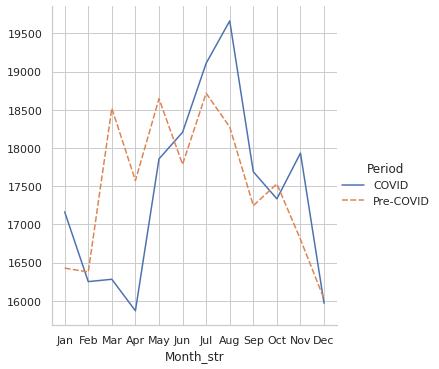

In [ ]:
sns.relplot(data=cross_tab_month, kind="line")

As seen above, crime rate during the covid months of February, March and pril experiences a sharp decline compared to the sharp increase in the same months pre-covid, but it skyrockets in May and even surpases the pre-covid crime rate in June. It reaches its peak in August greatly surpasing the apex of pre-covid before a sharp decline in September, a slight increase in November and finally a sudden plunge in the crime rate for both years in December

Now that we have an overview of the rate of crime for both years as described above, we want to now investigate further and explore the types of crime that are committed and the effect covid might have had on these crimes.
To begin, below is a list of all crimes and the cumulative frequency of these crimes across the two years.

In [ ]:
essex_df['Crime type'].value_counts()

Violence and sexual offences    140981
Anti-social behaviour            95253
Criminal damage and arson        32732
Public order                     31341
Vehicle crime                    26634
Other theft                      23339
Shoplifting                      18630
Burglary                         18156
Drugs                            12578
Other crime                       7422
Bicycle theft                     3949
Robbery                           3044
Possession of weapons             2880
Theft from the person             2327
Name: Crime type, dtype: int64

Given the total figures of these crime types, I will now determine the total numer of crimes before Covid and Now during Covid.

In [ ]:
essex_df['Period'].value_counts()

Pre-COVID    209932
COVID        209334
Name: Period, dtype: int64

The total figures above shows a slight decline in total crime rate during covid. However, this is not sufficient to say that all types of crime has lessened during covid. Due to the lock down during the period of covid as well as a lot of restrictions, some certain types of crime would probably be fueled to increase. To see this, let us find out the crime rate of particular offenses for covid and pre-covid

In [ ]:
cross_tab_crime = pd.crosstab(essex_df['Crime type'], essex_df['Period'])
cross_tab_crime

Period,COVID,Pre-COVID
Crime type,,
Anti-social behaviour,53470,41783
Bicycle theft,1794,2155
Burglary,7755,10401
Criminal damage and arson,15196,17536
Drugs,7042,5536
Other crime,3557,3865
Other theft,10120,13219
Possession of weapons,1288,1592
Public order,16219,15122


Let us visualize this further on a chart

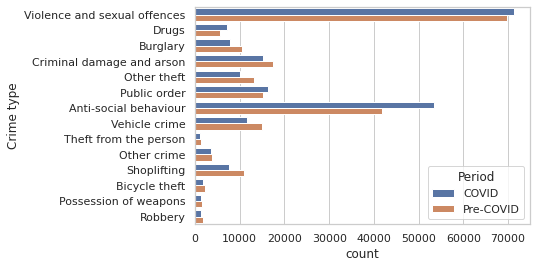

In [ ]:
sns.countplot(
    data=essex_df,
    y="Crime type", hue="Period",
)


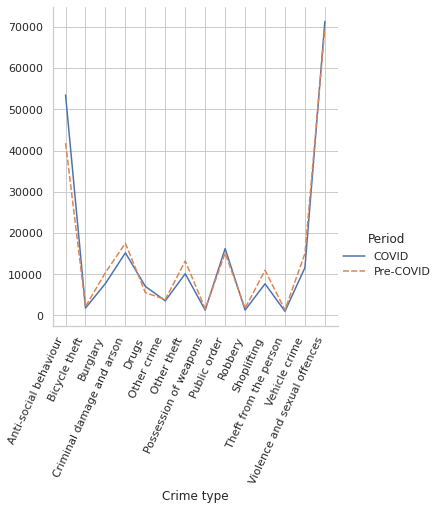

In [ ]:
g = sns.relplot(data=cross_tab_crime, kind="line")
g.set_xticklabels(rotation=65, horizontalalignment='right')

As seen in the charts above, there has been an increase crimes such as  Violence and Sexual offences, Drugs, violating public order, and Antisocial behaviours. It is most likely that these aformentioned crimes have been caused to rise due to the pandemic. on the other hand, crimes including Burglary, Criminal damage and arson, Shoplifting and Vehicle crime were on the decrease during the pandemic. Aside my chart, various crime researches has been carried out by the government and crime researchers and the type of crimes as I mentioned above has reportedly skyrocketed or depleted during the pandemic. The UK Research and organization has stated that Violent crime and drug offences have risen above pre-pandemic levels in deprived areas, research from the London School of Economics (LSE) and Political Science (UK Research and Innovation 2021). Also, Domestic abuse has gone up during lockdown, as victims have been trapped at home with their abusers (Casciani and Butcher 2021). Sexual offences might have risen too as some  victims might be trapped at home with thier abusers. kirchmaier and Villa-Llera 2021 supports "that Anti-social behaviour was much higher during lockdown than in previous years Since such behaviour includes severe breaches of social distancing measures, this means that lockdown created a new type of offence for the police to target".

 According to Langton, Dixton, and Farrel, 2021, "stay at home measures boost daytime guardians in residential areas (‘eyes on the street’), potentially reducing opportunities for burglary, vehicle crime, shoplifting, theft  and other outdoor crimes laying emphasis on these declines holding association with fluctuations in mobility". (Spinney 2020) also added that during the spring of 2020 when many countries imposed lockdowns, traditional crimes such as shoplifting and burglary fell because shops were closed and people were stuck at home.

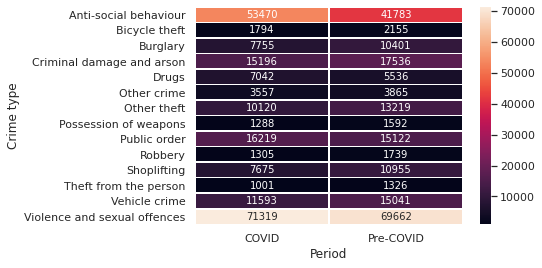

In [ ]:
ax = sns.heatmap(cross_tab_crime, annot=True, fmt="d", linewidths=.5)


For further visualization, I added this aesthetic heat map to further visualize the figures of the type of crimes committed Covid and Pre-Covid, by showing their intensity based on the colours.

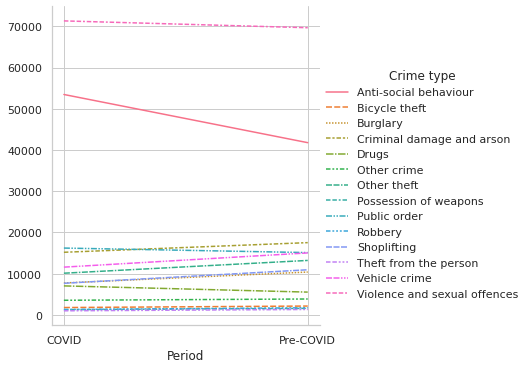

In [ ]:
sns.relplot(data=cross_tab_crime.transpose(), kind="line")

These colourful lines show also, the the crime rate between the listed offenses for both periods.

I have selected the top four Crime types that increased during Covid  compared to the Pre-Covid year. The crime trend is displayed below on the graph

In [ ]:
essex_grp = essex_df.groupby(['Crime type', 'Month_str', 'Period']).count()['Month'].to_frame().reset_index().rename({'Month': 'Count'}, axis=1)
essex_grp['Month_str'] = essex_grp['Month_str'].astype(month_cat)

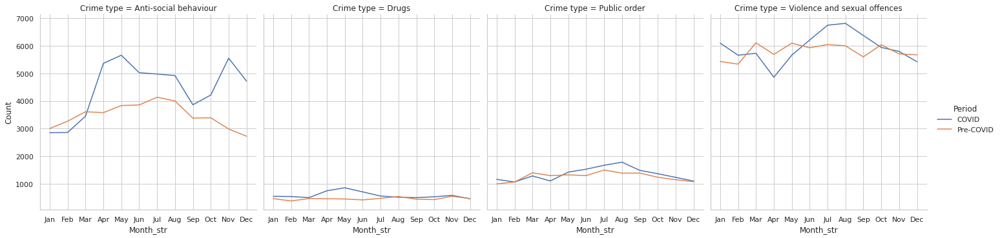

In [ ]:
essex_grp1 = essex_grp[essex_grp['Crime type'].isin(['Violence and sexual offences', 'Drugs',  'Public order', 'Anti-social behaviour'])]

sns.relplot(
    data=essex_grp1, x="Month_str", y="Count",
    col="Crime type", col_wrap=4, hue="Period",
    kind="line"
)

# ANTI-SOCIAL BEHAVIOUR

As we can see from the figure above, the number of crimes started out relatively even at the start of the respective years, however, in Covid year we see a drastic spike in the months of March and April, reaching its crescendo in May. However , there is a gradual decline in the crime rate for the months of June and July. A steep decline is seen in September and the frequency of crimes began to pick up again in October and reaching a similar peak as recorded in May by November when. A plunge is also noticed at the end of the year.

# DRUGS
From the figure above, number of crimes started out pretty even at the start of respective years, however, in Covid year for the month of April, we see an acceleration upwards hitting its peak in May. The months of June and July sees a gradual decline before it maintains a parellel trend between both years (Covid and Pre-Covid) till the end of the year.

# PUBLIC ORDER

As we can see from the figure above, the number of crime rates are fairly even at the begining of both years. Nonetheless, both years see an increase in March but Covid year sharply decreases in the month of April and skyrockets in May surpassing Pre-Covid year. It further rises up in June and July reaching its peak in August before plummeting rapidly side by side with Pre-Covid in the months of September, October, November, and finally december.

# VIOLENCE AND SEXUAL OFFENSES

From the figure above, the begining of the year for Covid saw a gradual slope while Pre-Covid saw a gradual rise in figures. In April, the figures for the Covid year dropped its lowest before rising drastically from May till it reaches it climax in August greatly surpassing the Pre-Covid year. A sharp decline is seen in the month of September down till it parallels with the Pre-Covid year by October both slopping down till the end of the year.

# DISCUSSION AND FINDINGS

What can be observed from all four charts above is that we see a consistency in the trend of their Covid year. The crime rates all skyrocket in the months of March and April except violence and Sexual Offenses along side public order which dropped in April,  before they all peak around May and August. This coincides with the rise of the Coronavirus cases and enforcement of lockdown. Thereafter, Anti-social behaviour and Drugs start to decline in the summer while the other crimes increases in the summer, which correlates most likely  with the loosening of lock down restrictions. All four crimes starts to see a plunge in fall, when the second lockdown is enforced but Anti-social behaviour accelerates again in the middle of fall before they all plunge in the final month of December. I will explain further.

For Anti-social behaviour, the spike in figures for months March to May is most likely due to the "stay at home" first lock down which spanned across months March to May. This means it was very easy for people to arrested for violating these restrictions. The National Police Chiefs' Council has said the "rise in Anti social behaviour has been linked to breaches of lock down measures". The gradual dicline in the months of June and July manifests around the time when the lock down measures were starting to get eased.
A steep decline is seen in September when the second lock down began and the frequency of crimes began to pick up again in October and reaching a similar peak by November as recorded in May, when the second lock down ends. A plunge is also noticed at the end of the year. There is a striking coincidence in the crime trend during both lock downs as thier third months each saw a rapid increase in the crime rate.

For Drugs crimes,  the month of April, we see an acceleration upwards hitting its peak in May. This is probably due to the lockdown as streets are empty and it makes it easy to identify drug criminals on the streets. (Langton 2020) discussed that Addiction experts have speculated that the lockdown could result in an increase in drug usage among recreational users. At the same time, some police forces have suggested that the demand for drugs has remained the same, but that drug dealers now stick out on otherwise empty streets, increasing the number of arrests. The months of June and July and August sees a gradual decline before which is when the lockdown restriction were eased and the streets most likely were not as empty as before so it might have been a bit difficult to identify them.  It maintains a parellel trend between both years during fall for the rest of the year probably due to offenders now knowing how to adapt to the situation.

For Public Order, the offenses started the year fairly even with the previous year and most likely started to reduce further in April because the lockdown had already been enforced and people had no choice but to stay inside, hence no avenue for public misconduct. But it however started to rise again towards the end of the lock down in May and quickly spikes through summer reaching its peak in August which is  around the time restrictions were getting eased, meaning  people could walk in public freely. It speedingly plunges towards the second lock down between months September and November. This is presumably due to the enforcement of the second lockdown, staying in doors once again preventing any form of social gathering.


For Violence and Sexual Offenses, it consists of Domestic abuse and sexual offenses. It is possible that sexual offenses started to drop at the begining of the year when social distancing rules started to get enforced and external or unknown offenders can no longer get thier victims easily except those stuck at home with thier perpetrators.  On the other hand, ( www.coventry.ac.uk,nd.) explains that there are indications that lockdown increased some sexual offences e.g. online-facilitated abuse, or sexual abuse perpetrated by family members and may have decreased others which would most likely include external abusers. On the part of domestic violence, in a study by (Kirchmaier et al 2021) he mentioned that  (Ivandic et al, 2020) purpoted that "While violent offences were lower on aggregate terms during lockdown, they were much more likely to be domestic incidents. Crimes committed by partners increased substantially, while it was much less likely for victims to suffer abuse from a former partner or unknown aggressor". This offences most likely bounced back starting from May as lockdown measures were eased and and alot of perpetrators were allowed back in the streets before the trend totally plunged again in September all the  way till December when the second lockdown started probably lowering sexual offenses but not domestic violence.

**Example for anti-social behavior:** As we can see from the figure above, the number of crimes started out relatively even at the start of the respective years, however, in 2020 we see a drastic spike in the number of crimes in the months of March and April, reaching its crescendo in May. Thereafter, there is a gradual decline in the crime rate in the months of June and July and then a steep decline in September (*what happened in September... any event?... no lockdown?*). The frequency of crimes began to pick up again in October reaching a similar peak (as recorded in May) in November and a plunge the final month of the year.

After explaining the four charts above, you can give a summary of what can be observed in all four. For example, we can see a consistent trend in the charts. The crime rates all skyrocket in the months of March and April peaking around May. This coincides with the rise of the coronavirus cases and the enforcement of lockdown. They also all experience a gradual decline in the summer months and then even more decline at the start of Fall. This correlates with the loosening of the lockdown restrictions. Finally, the frequency of crime rates began to pick up again and then plunging in the final months of the year.

I have selected the top four Crime types that decreased during Covid compared to the Pre-Covid year. The crime trend is displayed below on the graph

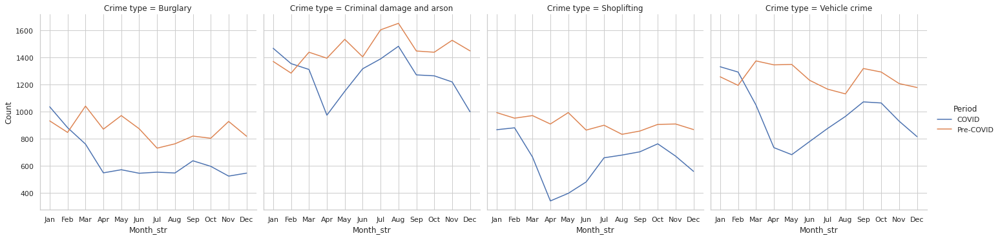

In [ ]:
essex_grp2 = essex_grp[essex_grp['Crime type'].isin(['Burglary', 'Criminal damage and arson',  'Vehicle crime', 'Shoplifting'])]

sns.relplot(
    data=essex_grp2, x="Month_str", y="Count",
    col="Crime type", col_wrap=4, hue="Period",
    kind="line"
)

# BURGLARY

From the chart above, the Crime rate for Burglary cases in the Covid year began at a similar frequency as can be observed in the year before. However there is a sudden decline in the month of March and even lower crime rate in April. The crime rate plateaued in the subsequent months until a slight increase in September followed by a gradual decrease for the rest of the year.  


# CRIMINAL DAMAGE AND ARSON

From the figures above, the crime rates flowed at the same pace for the beginning of both years until a drastic decline is recorded for Covid year beginning in march. It further plunges to its lowest in April before sharply rising again in May reaching its peak in August but the Pre-Covid year still surpasses it greatly. It begins to plunge deeply again from the month of September and slopes all the way down to December.


# SHOPLIFTING

As seen in the figure above, offences maintained a plateau at the begining of both years. The Covid year experiences an extreme deep in month of March, reaching its lowest point in April. It starts to rise gradually in May and sees a signinifant rise till July where it rises further at a slow pace and reaches a high in October with Pre-Covid month still surpasing it. It finally plunges into the final months of November and December.


# VEHICLE CRIME

From the chart above, it can be noticed that both years begin the year at similar frequencies. The covid year experiences a massive fall starting from the month of March and slowly plateauing in May. It rises rapidly in the Month of June skyrocketing further to September before plateauing in October and finally plunging into December.


# DISCUSSION AND FINDINGS

A very strong similarity is seen in the consistency of trends in each chart  The crime rates all depleted in the months of March, April and May. This coincides with the rise of the coronavirus cases and the enforcement of lockdown. They also all experience a rapid increase in the summer months. This correlates with the loosening of the lockdown restrictions. Finally, the frequency of crime rates deeply  plunges in the final months of the year as the seconf lock down begins.

For Burglary, The offenses start to decline greatly at the begining of the first lock down month March to May and  when measures were relaxed in the summer it plateaued before declining into the second lockdown in fall.(Halford et al 2020) says that Recorded burglary dwelling declined a quarter by the first week of lockdown. By any normal measure this was a large decline. It is likely explained by increased home guardianship and surveillance (including of neighbours) as residents stayed home.

For Criminal damage and arson, The deep plunge occurs at the begining of the first lock down in March before rising again towards the end of the lockdown in May. This is most likey because outdoor movement was prohibited making it difficult for perpetrators of such crime have mobility. (Linforth 2021) supports that With huge swathes of the population adhering to government guidance to ‘Stay at home’, it is clear there have been fewer opportunities for crimes like Criminal damage and arson which fell to roughly about  50 percent. The offenses can be seen skyrocketing in summer when the restrictions are eased probably due to the fact that they can leave thier houses and then a deep plunged similarly occuring again when the Seconf lockdown begins.

For Shoplifting, As the pattern repeats itself, we can see that the plunges occured during the first lockdown before rising back when the restrictions were eased in the summer and once more deeping when the second lockdown began. (sponsor 2020) elucidates that Even though shoplifting dramatically declined following the first weeks of lockdown according to a study from National Center for Biotechnology Information, this is because most retail (non-grocery) shops and stores closed down, heavily reducing the opportunities for shoplifting. As retail stores reopened their doors in June, many likely saw an increase in shoplifting, fuelled by the start of the recession. Shoplifting surged to record levels in the UK

For Vehicle crime, The similarities repeats its self as the crimes drastically drop into the first lockdown and skyrockets in summer before plunging into the second lock down which is probably due to the lack of mobility during the lockdown and the increment in summer due to the ease of restrictions before plunging again when the new lock down began.








I want to display some of the crimes on a map.

In [ ]:
import folium
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
from folium.plugins import MeasureControl

In [ ]:
essex_df_nona = essex_df.dropna(subset=['Longitude', 'Latitude'])


In [ ]:
crime_map = folium.Map(location=[51.77, 0.67], control_scale = True, zoom_start=10)
crime_map.add_child(MeasureControl())

NameError: ignored

In [ ]:
essex_burg = essex_df_nona.loc[essex_df_nona['Crime type'] == 'Burglary']
#essex_burg = essex_burg.loc[essex_burg['Period'] == 'Pre-CoVID']
burg_map = essex_burg[['Latitude', 'Longitude']].to_numpy()
crime_map.add_child(plugins.MarkerCluster(burg_map))
crime_map.add_child(plugins.HeatMap(burg_map))
crime_map

In [ ]:
essex_anti = essex_df_nona.loc[essex_df['Crime type'] == 'Anti-social behaviour']
anti_map = essex_anti[['Latitude', 'Longitude']].to_numpy()
crime_map.add_child(plugins.MarkerCluster(anti_map))
crime_map.add_child(plugins.HeatMap(anti_map))
crime_map

Anti-social behaviour seems a little too large for the code to be run, it has refused to display.

 :)



# CONCLUSION

This study has examined the effect of Covid 19 on crime rate. consistent trends has been seen in specific months of lockdowns and post lockdowns. There is an indication that some crimes have increased during this period and some decreased. The restriction of movements has lowered a number of crimes such as Burglary, Vehicle crime, Shoplifting and so on.And on the other hand has increased crimes such as violence which includes domestic abuse  and sexual offenses, Anti-social behaviour and the likes.  The easing of restrictions also showed how some crimes skyrocketed such as Public order offenses  and more sexual offenses. In a way, the lockdown curbed some crimes and fostered some. It suffices to say that Covid 19 has had an effect of crime rate.


Below are my references

In [ ]:
# Run this to install the docx package
# pip install python-docx

     |████████████████████████████████| 5.5MB 10.5MB/s 
  Created wheel for python-docx: filename=python_docx-0.8.10-cp37-none-any.whl size=184491 sha256=eb4bed8942ebcbcec3a068f44e3801030b3fdc5d9b62605932594a666712445d
  Stored in directory: /root/.cache/pip/wheels/18/0b/a0/1dd62ff812c857c9e487f27d80d53d2b40531bec1acecfa47b
Successfully built python-docx


In [ ]:
import docx
doc = docx.Document("/content/drive/MyDrive/my_reference_list.docx")
all_paras = doc.paragraphs
for para in all_paras:
  print (para.text)
  print("-----")

PackageNotFoundError: ignored